## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "singer_age_decade_50"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "singer_age_decade"
target_positive_class = 50


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 100


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6350
Epoch 11 Validation Loss: 0.6886
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_50/loss_history.json


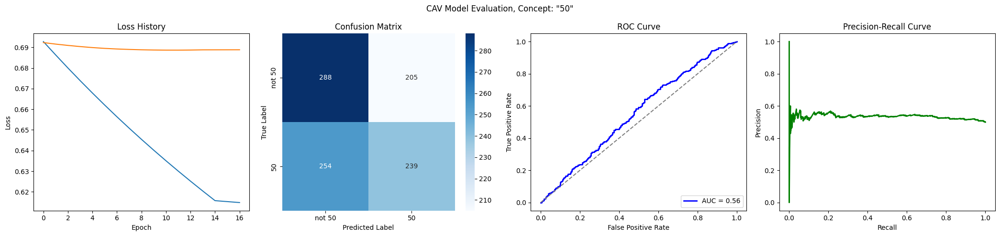

Training run 2/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6422
Epoch 11 Validation Loss: 0.6772
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5953
Epoch 21 Validation Loss: 0.6699
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5554
Epoch 31 Validation Loss: 0.6660
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5213
Epoch 41 Validation Loss: 0.6654
Early stopping at epoch 45
Loss history saved to trainings/singer_age_decade_50/loss_history.json


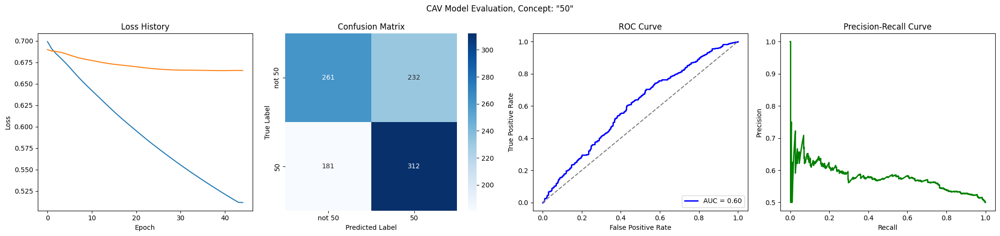

Training run 3/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6401
Epoch 11 Validation Loss: 0.6787
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5933
Epoch 21 Validation Loss: 0.6695
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5539
Epoch 31 Validation Loss: 0.6662
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 39
Loss history saved to trainings/singer_age_decade_50/loss_history.json


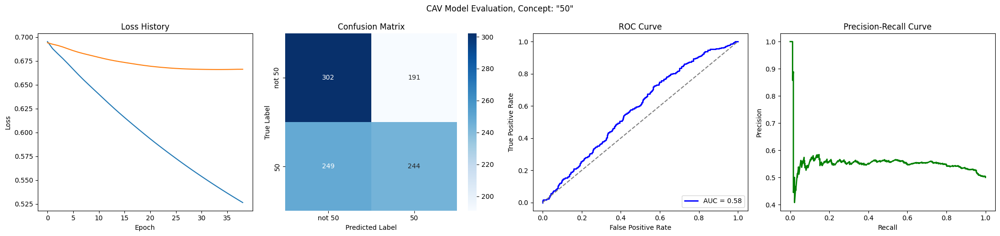

Training run 4/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6879
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6454
Epoch 11 Validation Loss: 0.6684
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6032
Epoch 21 Validation Loss: 0.6538
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5663
Epoch 31 Validation Loss: 0.6435
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5336
Epoch 41 Validation Loss: 0.6368
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5044
Epoch 51 Validation Loss: 0.6330
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4780
Epoch 61 Validation Loss: 0.6312
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

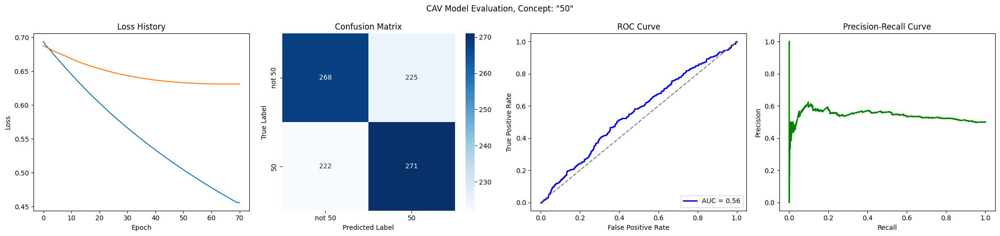

Training run 5/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6961
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6445
Epoch 11 Validation Loss: 0.6873
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5996
Epoch 21 Validation Loss: 0.6836
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5610
Epoch 31 Validation Loss: 0.6819
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 36
Loss history saved to trainings/singer_age_decade_50/loss_history.json


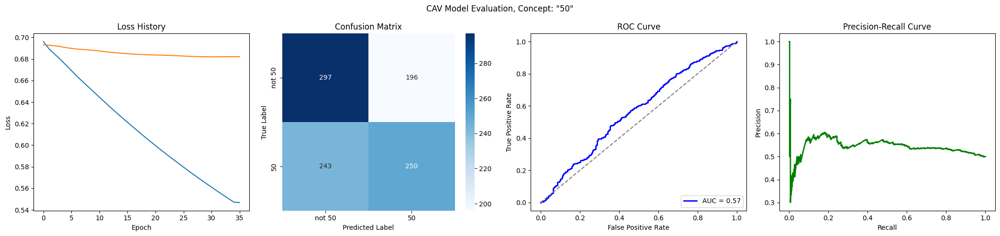

Training run 6/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6888
Epoch 1 Validation Loss: 0.6886
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6403
Epoch 11 Validation Loss: 0.6834
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5974
Epoch 21 Validation Loss: 0.6810
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_50/loss_history.json


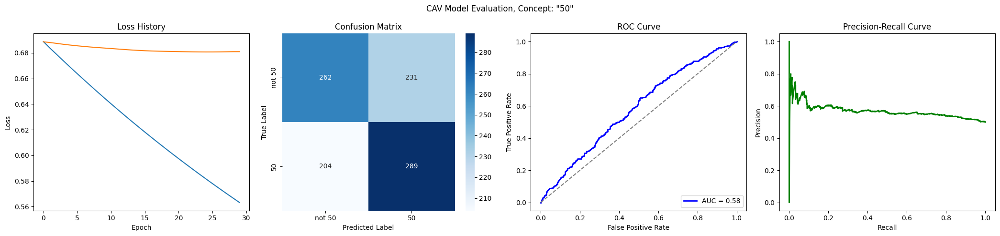

Training run 7/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6366
Epoch 11 Validation Loss: 0.6862
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5889
Epoch 21 Validation Loss: 0.6855
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_50/loss_history.json


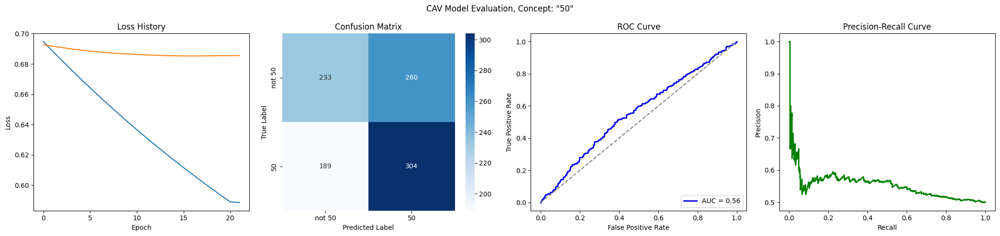

Training run 8/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6907
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6404
Epoch 11 Validation Loss: 0.6794
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5984
Epoch 21 Validation Loss: 0.6752
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5633
Epoch 31 Validation Loss: 0.6747
Early stopping at epoch 32
Loss history saved to trainings/singer_age_decade_50/loss_history.json


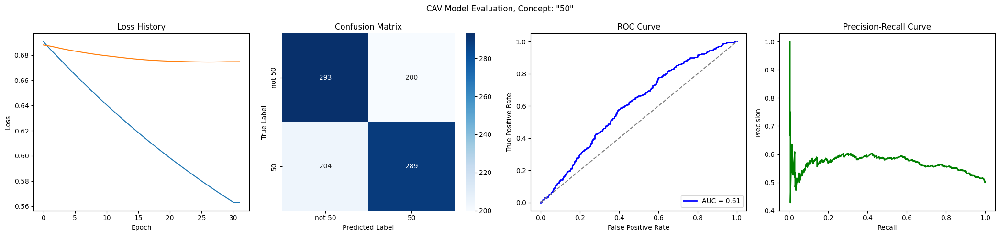

Training run 9/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6908
Epoch 1 Validation Loss: 0.6850
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6392
Epoch 11 Validation Loss: 0.6724
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5952
Epoch 21 Validation Loss: 0.6646
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5579
Epoch 31 Validation Loss: 0.6607
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5256
Epoch 41 Validation Loss: 0.6597
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_50/loss_history.json


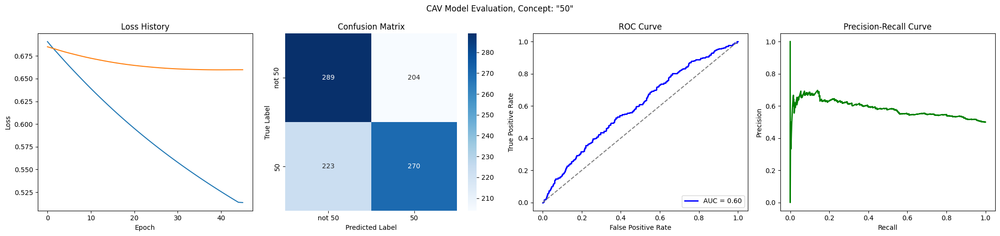

Training run 10/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6491
Epoch 11 Validation Loss: 0.6840
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6073
Epoch 21 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5712
Epoch 31 Validation Loss: 0.6776
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5394
Epoch 41 Validation Loss: 0.6757
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_50/loss_history.json


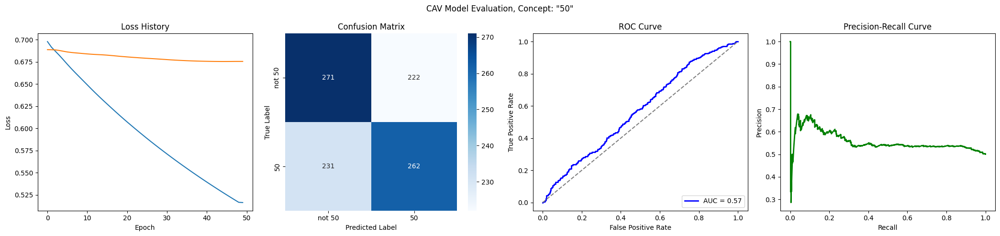

Training run 11/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6405
Epoch 11 Validation Loss: 0.6753
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5931
Epoch 21 Validation Loss: 0.6614
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5529
Epoch 31 Validation Loss: 0.6537
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5188
Epoch 41 Validation Loss: 0.6509
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_50/loss_history.json


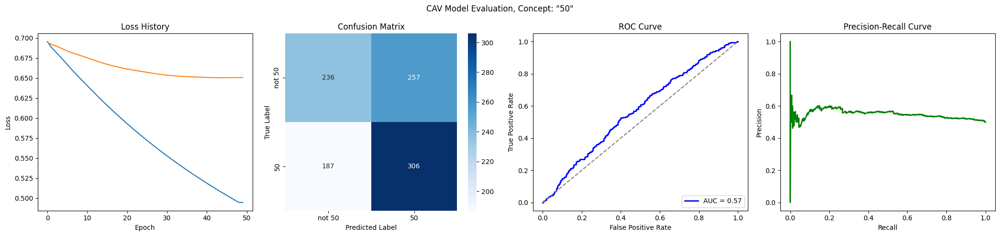

Training run 12/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6358
Epoch 11 Validation Loss: 0.6799
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5874
Epoch 21 Validation Loss: 0.6756
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/singer_age_decade_50/loss_history.json


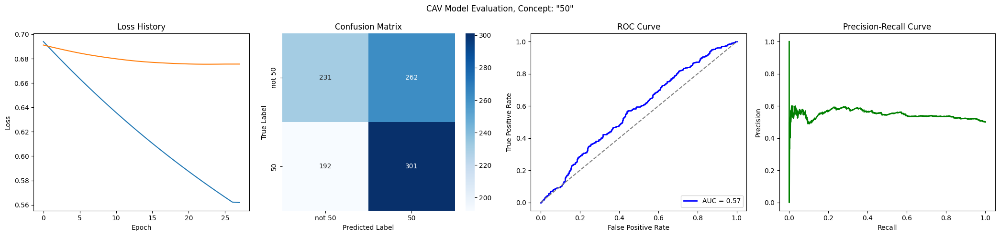

Training run 13/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6373
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5922
Epoch 21 Validation Loss: 0.6611
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5558
Epoch 31 Validation Loss: 0.6536
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5252
Epoch 41 Validation Loss: 0.6492
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4988
Epoch 51 Validation Loss: 0.6463
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4752
Epoch 61 Validation Loss: 0.6443
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

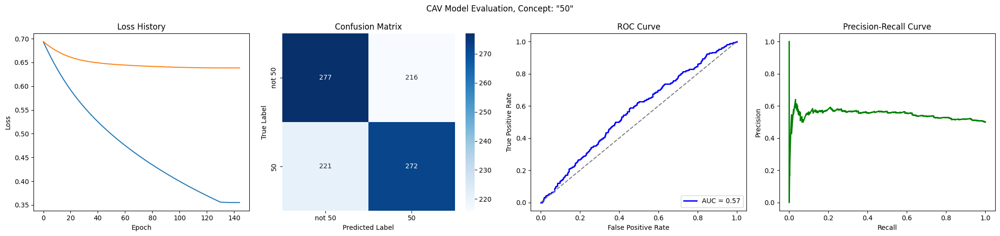

Training run 14/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6410
Epoch 11 Validation Loss: 0.6925
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_50/loss_history.json


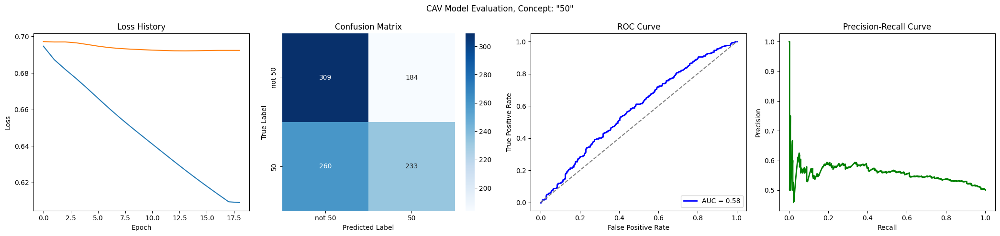

Training run 15/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6367
Epoch 11 Validation Loss: 0.6802
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5890
Epoch 21 Validation Loss: 0.6767
Early stopping at epoch 24
Loss history saved to trainings/singer_age_decade_50/loss_history.json


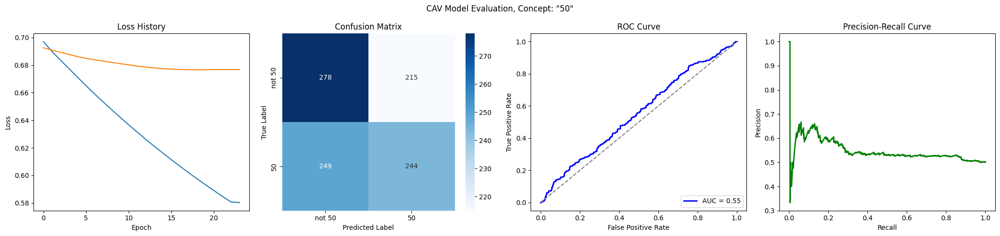

Training run 16/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6982
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 9
Loss history saved to trainings/singer_age_decade_50/loss_history.json


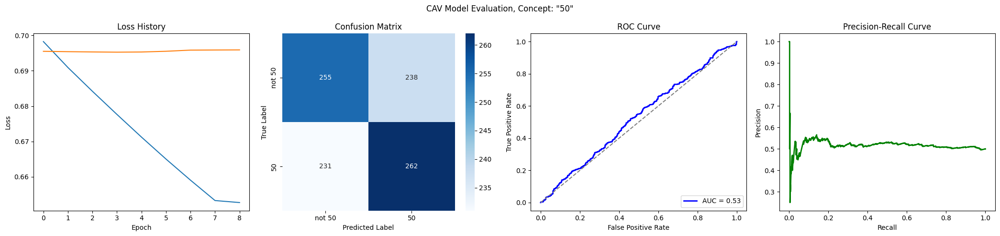

Training run 17/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6406
Epoch 11 Validation Loss: 0.6878
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5982
Epoch 21 Validation Loss: 0.6869
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_50/loss_history.json


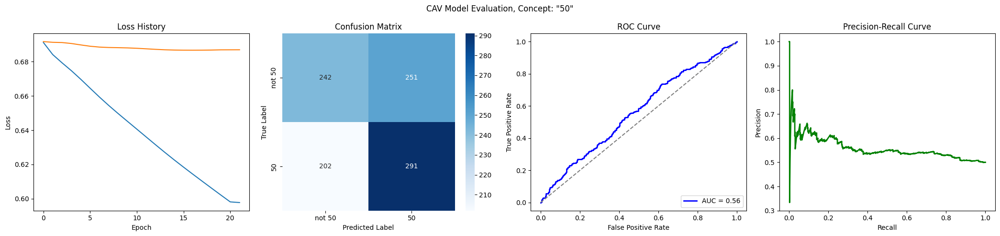

Training run 18/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6528
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6131
Epoch 21 Validation Loss: 0.6609
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5791
Epoch 31 Validation Loss: 0.6532
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5494
Epoch 41 Validation Loss: 0.6489
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5228
Epoch 51 Validation Loss: 0.6466
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4988
Epoch 61 Validation Loss: 0.6457
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 68
Los

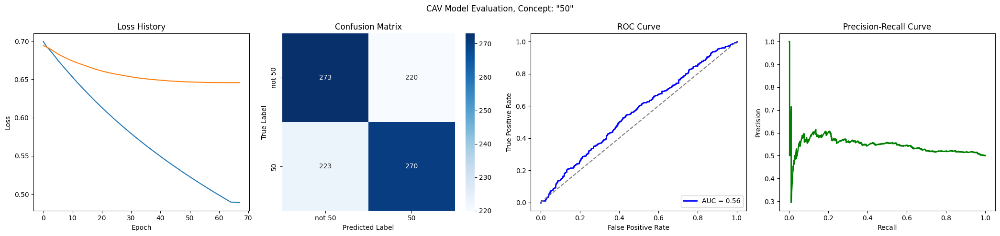

Training run 19/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7006
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6544
Epoch 11 Validation Loss: 0.6803
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6136
Epoch 21 Validation Loss: 0.6708
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5777
Epoch 31 Validation Loss: 0.6639
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5460
Epoch 41 Validation Loss: 0.6594
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5175
Epoch 51 Validation Loss: 0.6575
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/singer_age_decade_50/loss_history.json


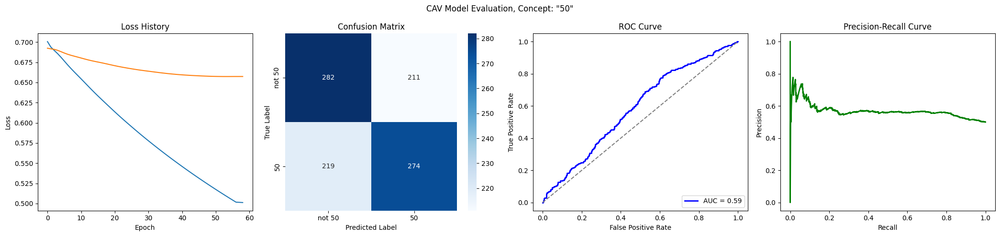

Training run 20/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6454
Epoch 11 Validation Loss: 0.6857
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_50/loss_history.json


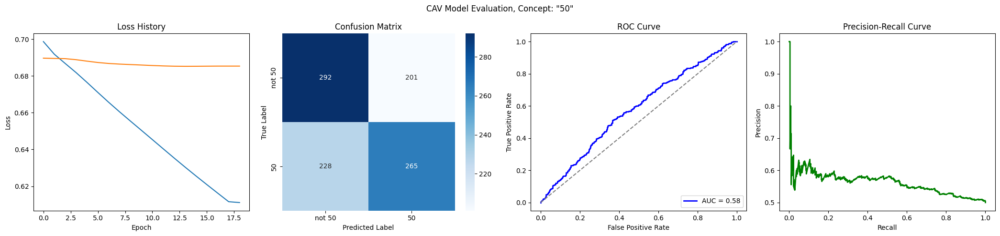

Training run 21/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6891
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6426
Epoch 11 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_50/loss_history.json


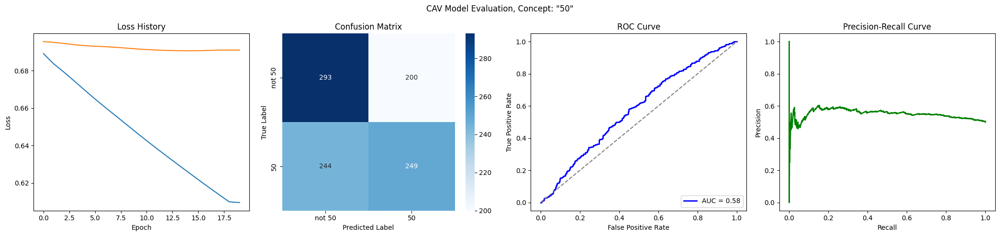

Training run 22/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6540
Epoch 11 Validation Loss: 0.6910
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_50/loss_history.json


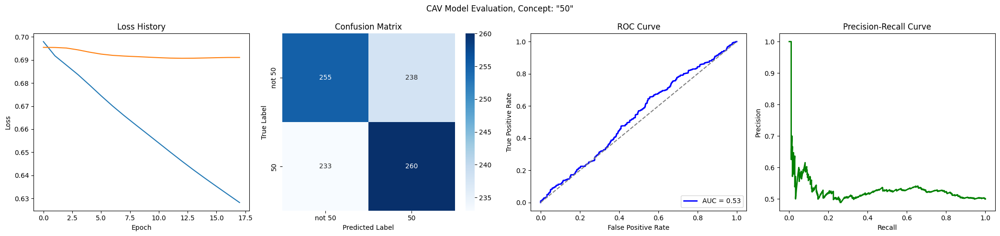

Training run 23/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6443
Epoch 11 Validation Loss: 0.6771
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6005
Epoch 21 Validation Loss: 0.6648
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5636
Epoch 31 Validation Loss: 0.6563
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5319
Epoch 41 Validation Loss: 0.6507
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5043
Epoch 51 Validation Loss: 0.6471
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4798
Epoch 61 Validation Loss: 0.6450
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

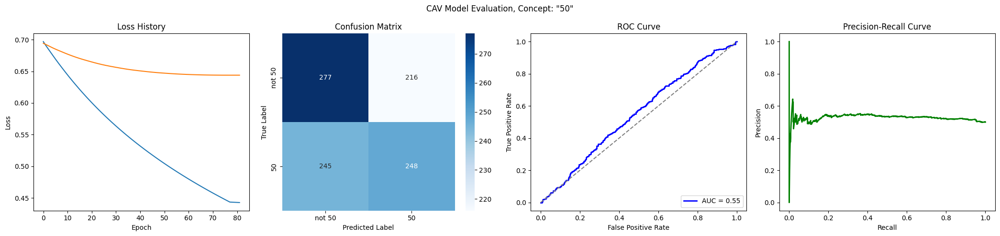

Training run 24/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6822
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6087
Epoch 21 Validation Loss: 0.6758
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5730
Epoch 31 Validation Loss: 0.6731
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5420
Epoch 41 Validation Loss: 0.6712
Early stopping at epoch 44
Loss history saved to trainings/singer_age_decade_50/loss_history.json


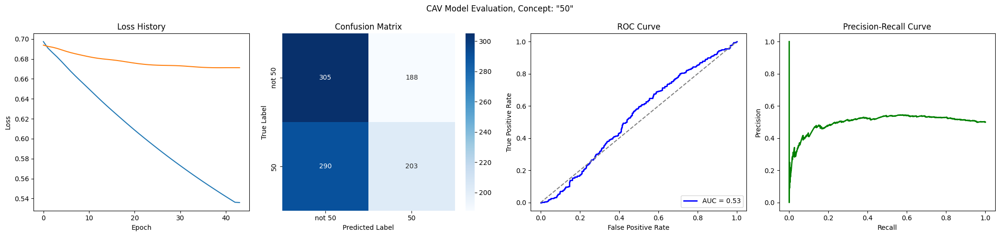

Training run 25/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6470
Epoch 11 Validation Loss: 0.6812
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6022
Epoch 21 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5636
Epoch 31 Validation Loss: 0.6684
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5302
Epoch 41 Validation Loss: 0.6653
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5006
Epoch 51 Validation Loss: 0.6645
Early stopping at epoch 55
Loss history saved to trainings/singer_age_decade_50/loss_history.json


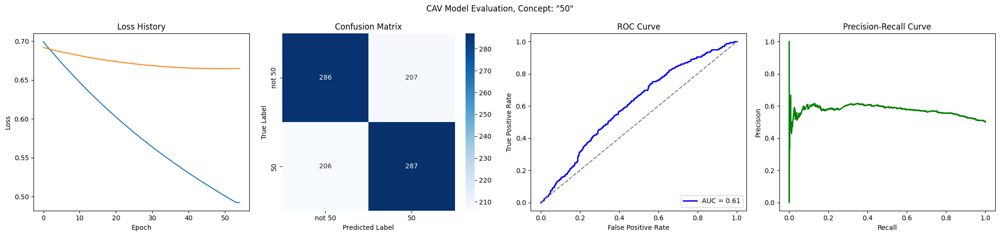

Training run 26/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6344
Epoch 11 Validation Loss: 0.6788
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5870
Epoch 21 Validation Loss: 0.6745
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5477
Epoch 31 Validation Loss: 0.6739
Early stopping at epoch 33
Loss history saved to trainings/singer_age_decade_50/loss_history.json


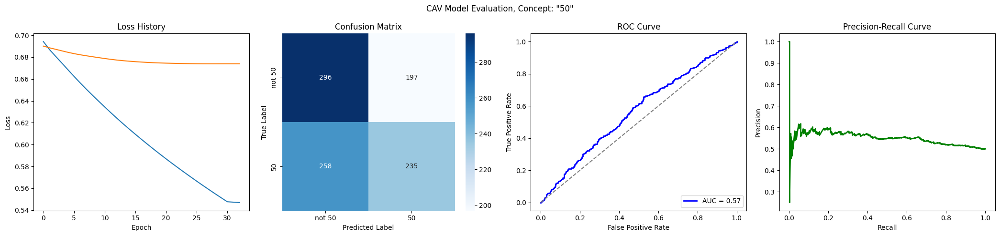

Training run 27/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6517
Epoch 11 Validation Loss: 0.6756
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6166
Epoch 21 Validation Loss: 0.6666
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5863
Epoch 31 Validation Loss: 0.6621
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5588
Epoch 41 Validation Loss: 0.6599
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5337
Epoch 51 Validation Loss: 0.6590
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5105
Epoch 61 Validation Loss: 0.6586
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

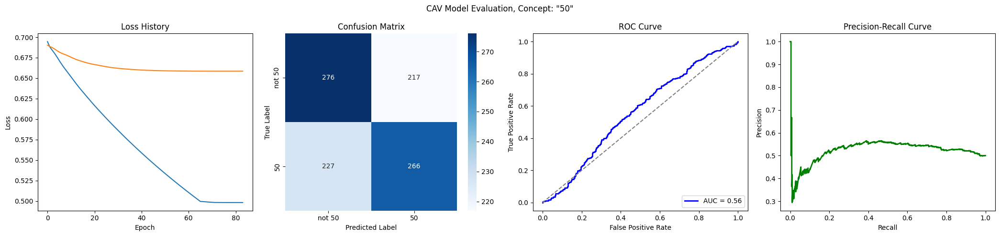

Training run 28/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 10
Loss history saved to trainings/singer_age_decade_50/loss_history.json


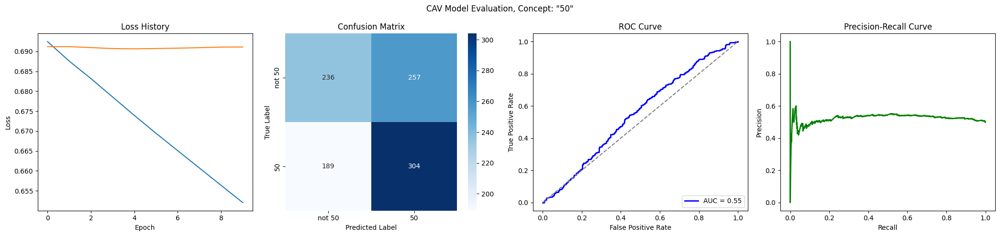

Training run 29/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6417
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5991
Epoch 21 Validation Loss: 0.6828
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_50/loss_history.json


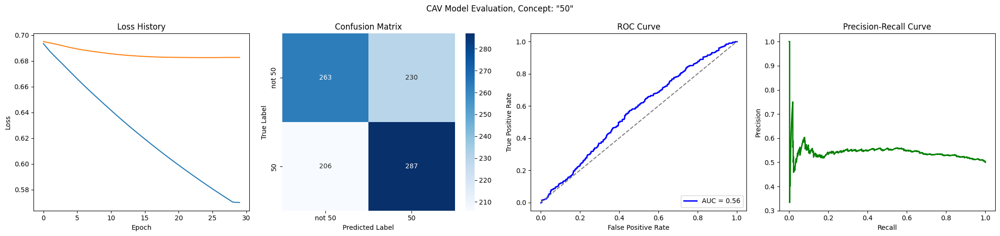

Training run 30/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6438
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6027
Epoch 21 Validation Loss: 0.6838
Early stopping at epoch 25
Loss history saved to trainings/singer_age_decade_50/loss_history.json


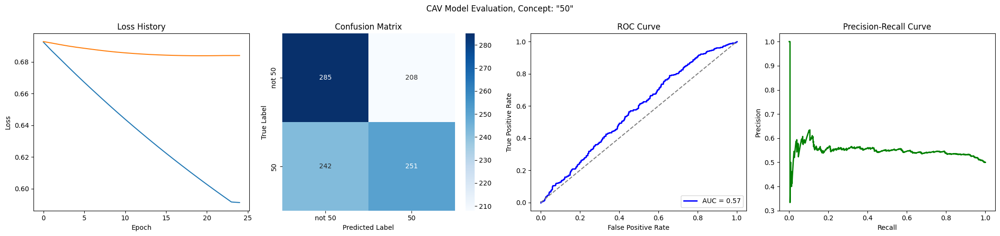

Training run 31/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6976
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_50/loss_history.json


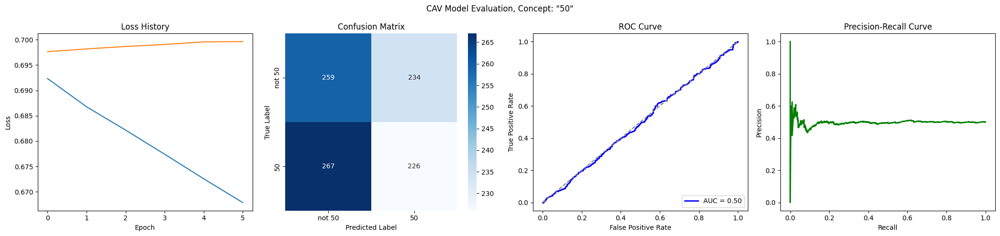

Training run 32/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6492
Epoch 11 Validation Loss: 0.6842
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6096
Epoch 21 Validation Loss: 0.6795
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5750
Epoch 31 Validation Loss: 0.6793
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_50/loss_history.json


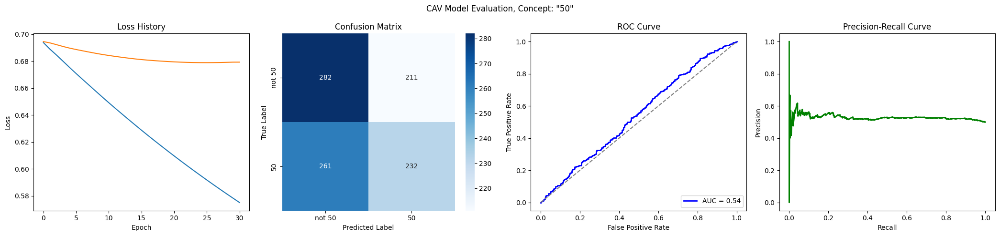

Training run 33/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6890
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6414
Epoch 11 Validation Loss: 0.6874
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6018
Epoch 21 Validation Loss: 0.6837
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5677
Epoch 31 Validation Loss: 0.6795
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5378
Epoch 41 Validation Loss: 0.6763
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5111
Epoch 51 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/singer_age_decade_50/loss_history.json


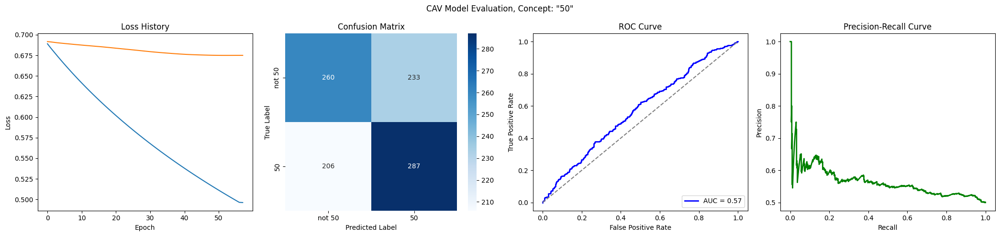

Training run 34/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7043
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6565
Epoch 11 Validation Loss: 0.6852
Epoch 21/500
Epoch 21 Train Loss: 0.6216
Epoch 21 Validation Loss: 0.6826
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5906
Epoch 31 Validation Loss: 0.6808
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5627
Epoch 41 Validation Loss: 0.6786
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5374
Epoch 51 Validation Loss: 0.6774
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5206
Epoch 61 Validation Loss: 0.6773
Early stopping at epoch 61
Loss history saved to trainings/singer_age_decade_50/loss_history.json


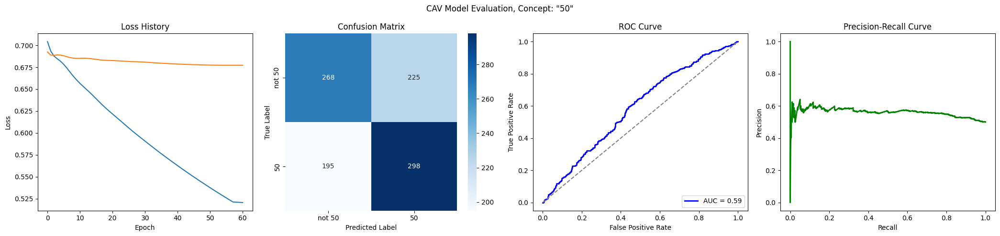

Training run 35/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6991
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6401
Epoch 11 Validation Loss: 0.6802
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5940
Epoch 21 Validation Loss: 0.6662
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5550
Epoch 31 Validation Loss: 0.6587
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5216
Epoch 41 Validation Loss: 0.6559
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4926
Epoch 51 Validation Loss: 0.6556
Early stopping at epoch 52
Loss history saved to trainings/singer_age_decade_50/loss_history.json


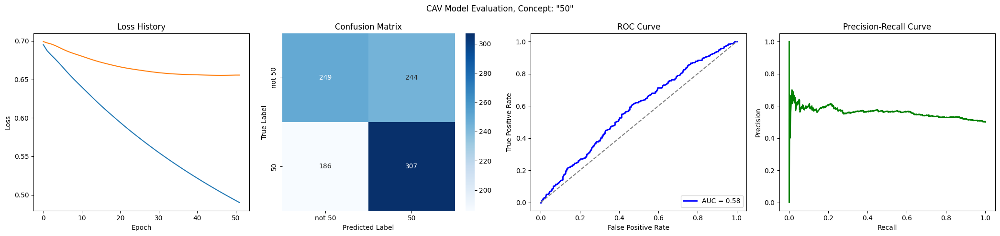

Training run 36/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7019
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6400
Epoch 11 Validation Loss: 0.6792
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5895
Epoch 21 Validation Loss: 0.6703
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5480
Epoch 31 Validation Loss: 0.6684
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 38
Loss history saved to trainings/singer_age_decade_50/loss_history.json


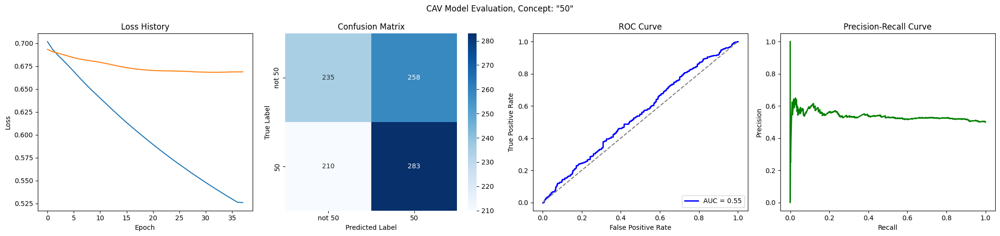

Training run 37/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6377
Epoch 11 Validation Loss: 0.6864
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5933
Epoch 21 Validation Loss: 0.6818
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5559
Epoch 31 Validation Loss: 0.6801
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 37
Loss history saved to trainings/singer_age_decade_50/loss_history.json


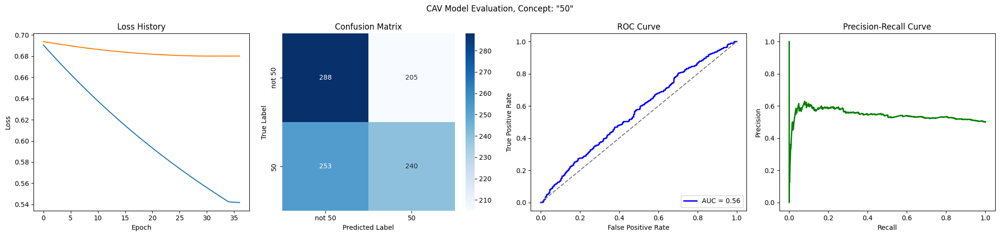

Training run 38/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6911
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6369
Epoch 11 Validation Loss: 0.6838
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5910
Epoch 21 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/singer_age_decade_50/loss_history.json


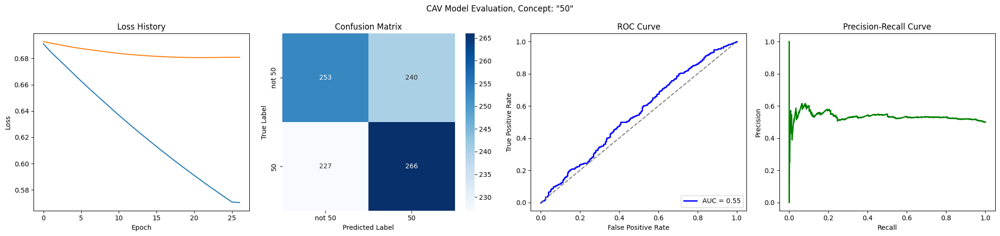

Training run 39/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6460
Epoch 11 Validation Loss: 0.6849
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_50/loss_history.json


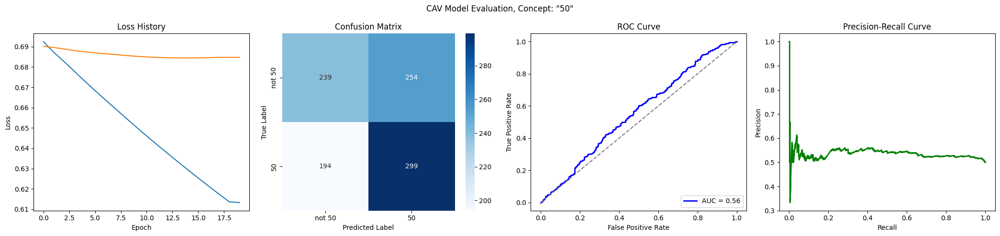

Training run 40/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6901
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6384
Epoch 11 Validation Loss: 0.6718
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5936
Epoch 21 Validation Loss: 0.6580
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5550
Epoch 31 Validation Loss: 0.6491
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5215
Epoch 41 Validation Loss: 0.6440
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4921
Epoch 51 Validation Loss: 0.6417
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4660
Epoch 61 Validation Loss: 0.6412
Early stopping at epoch 64
Loss history saved to trainings/singer_age_decade_50/loss_histor

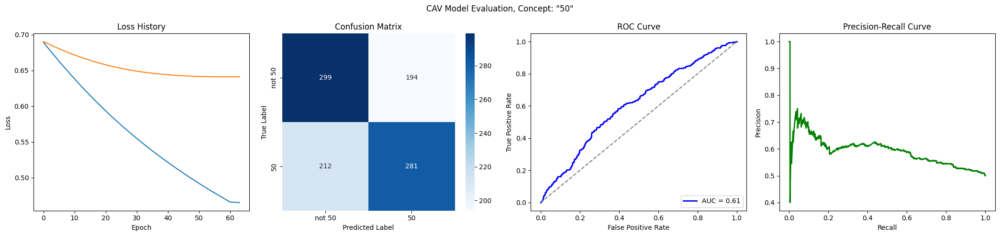

Training run 41/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6974
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 10
Loss history saved to trainings/singer_age_decade_50/loss_history.json


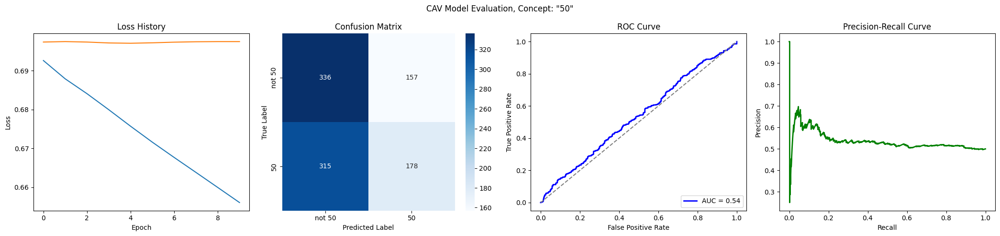

Training run 42/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6383
Epoch 11 Validation Loss: 0.6894
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_50/loss_history.json


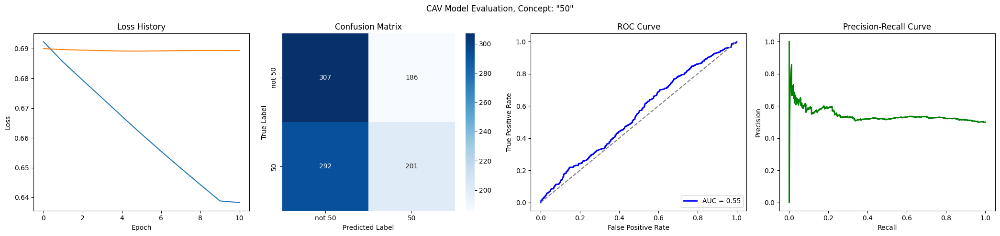

Training run 43/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6437
Epoch 11 Validation Loss: 0.6835
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5966
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/singer_age_decade_50/loss_history.json


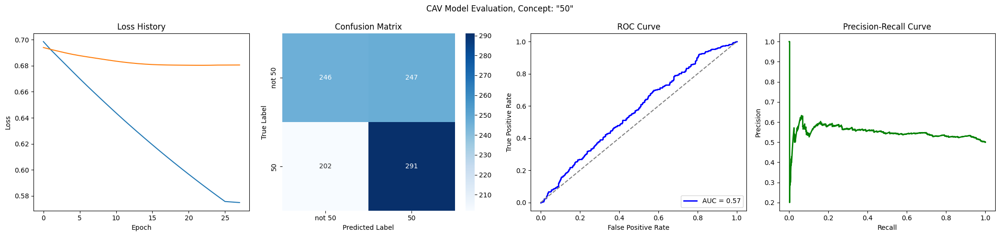

Training run 44/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6988
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6444
Epoch 11 Validation Loss: 0.6679
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5987
Epoch 21 Validation Loss: 0.6518
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5601
Epoch 31 Validation Loss: 0.6399
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5269
Epoch 41 Validation Loss: 0.6311
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4979
Epoch 51 Validation Loss: 0.6254
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4722
Epoch 61 Validation Loss: 0.6225
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

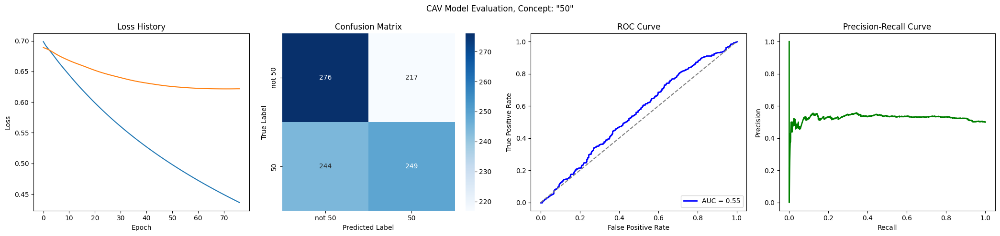

Training run 45/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6982
Epoch 1 Validation Loss: 0.6994
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_50/loss_history.json


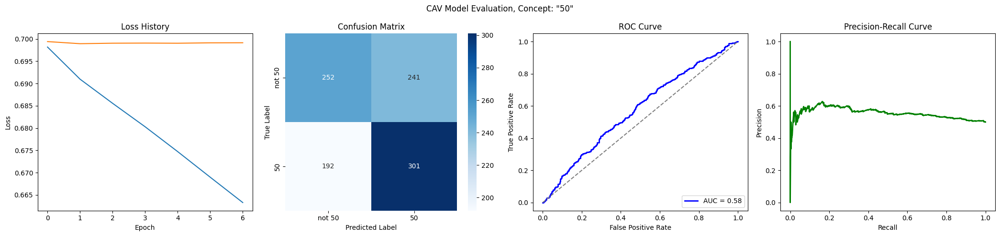

Training run 46/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6352
Epoch 11 Validation Loss: 0.6819
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5847
Epoch 21 Validation Loss: 0.6752
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5432
Epoch 31 Validation Loss: 0.6705
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5075
Epoch 41 Validation Loss: 0.6667
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4766
Epoch 51 Validation Loss: 0.6644
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4494
Epoch 61 Validation Loss: 0.6637
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 66
Los

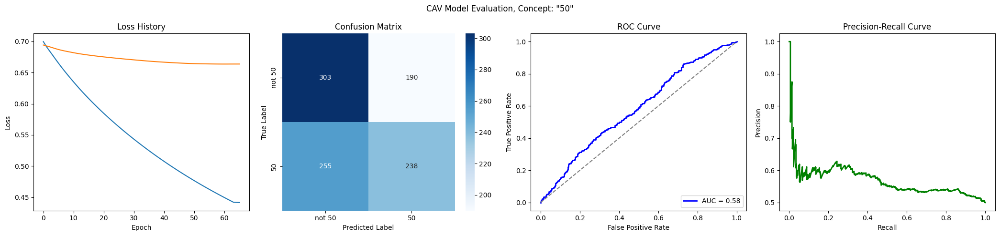

Training run 47/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7024
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6497
Epoch 11 Validation Loss: 0.6738
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6107
Epoch 21 Validation Loss: 0.6619
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5775
Epoch 31 Validation Loss: 0.6521
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5486
Epoch 41 Validation Loss: 0.6452
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5230
Epoch 51 Validation Loss: 0.6396
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5000
Epoch 61 Validation Loss: 0.6356
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

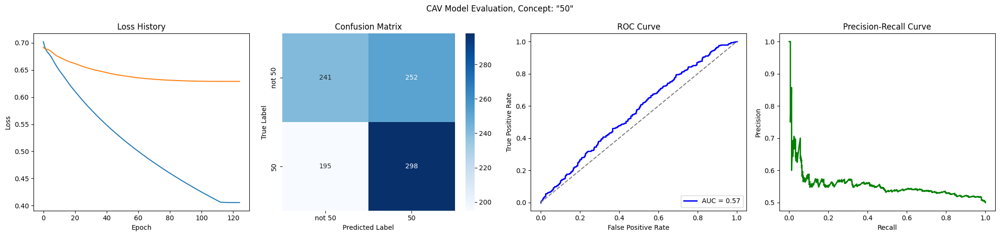

Training run 48/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6425
Epoch 11 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5970
Epoch 21 Validation Loss: 0.6597
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5588
Epoch 31 Validation Loss: 0.6498
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5267
Epoch 41 Validation Loss: 0.6438
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4992
Epoch 51 Validation Loss: 0.6404
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4750
Epoch 61 Validation Loss: 0.6389
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

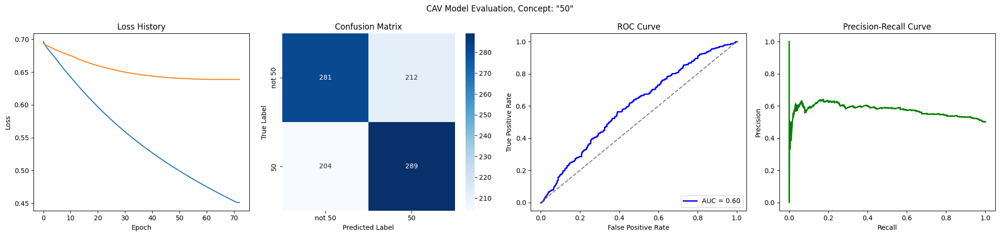

Training run 49/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6440
Epoch 11 Validation Loss: 0.6743
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5984
Epoch 21 Validation Loss: 0.6637
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5599
Epoch 31 Validation Loss: 0.6588
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5274
Epoch 41 Validation Loss: 0.6580
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_50/loss_history.json


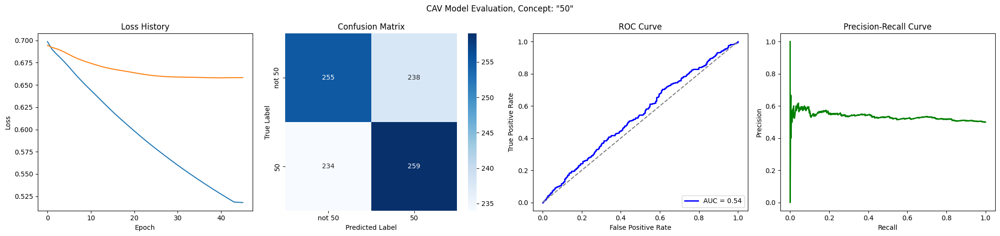

Training run 50/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6883
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6475
Epoch 11 Validation Loss: 0.6793
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6084
Epoch 21 Validation Loss: 0.6758
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5751
Epoch 31 Validation Loss: 0.6749
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5455
Epoch 41 Validation Loss: 0.6746
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_50/loss_history.json


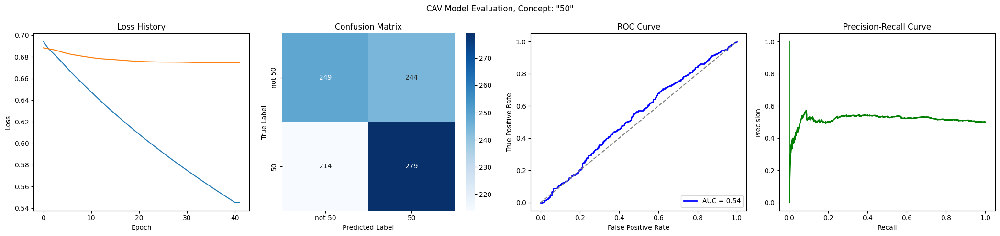

Training run 51/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6496
Epoch 11 Validation Loss: 0.6871
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6120
Epoch 21 Validation Loss: 0.6829
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5780
Epoch 31 Validation Loss: 0.6797
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5472
Epoch 41 Validation Loss: 0.6784
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_50/loss_history.json


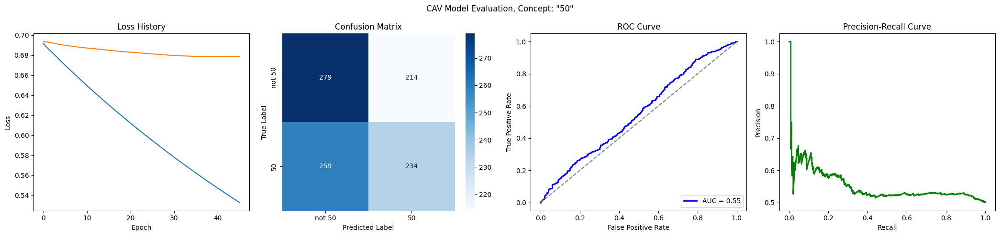

Training run 52/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6404
Epoch 11 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5940
Epoch 21 Validation Loss: 0.6866
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5538
Epoch 31 Validation Loss: 0.6864
Early stopping at epoch 33
Loss history saved to trainings/singer_age_decade_50/loss_history.json


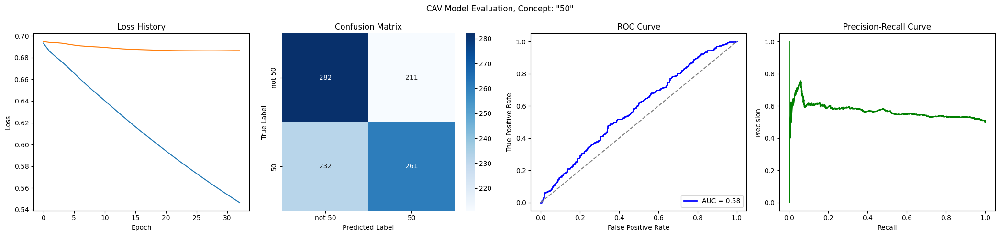

Training run 53/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6563
Epoch 11 Validation Loss: 0.6927
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_50/loss_history.json


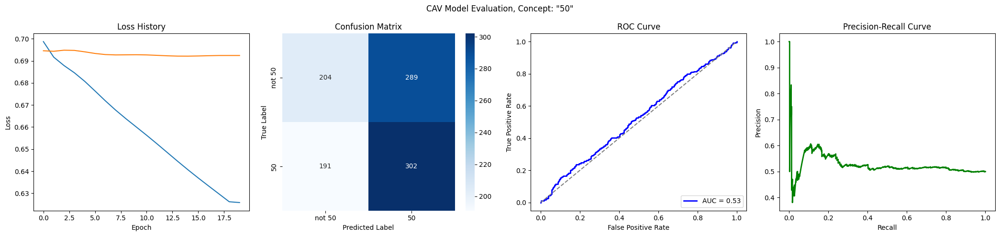

Training run 54/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6936
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6408
Epoch 11 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5964
Epoch 21 Validation Loss: 0.6656
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5593
Epoch 31 Validation Loss: 0.6606
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5279
Epoch 41 Validation Loss: 0.6581
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5005
Epoch 51 Validation Loss: 0.6571
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 60
Loss history saved to trainings/singer_age_decade_50/loss_history.json


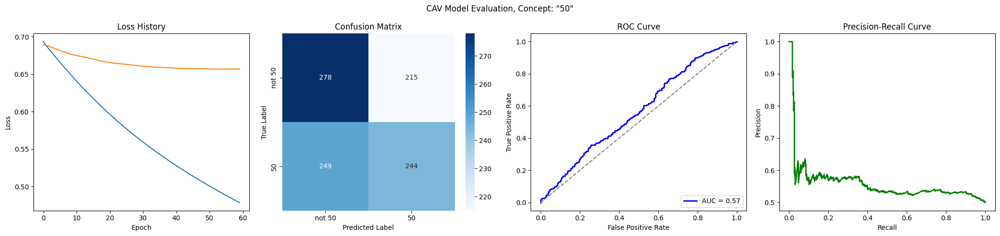

Training run 55/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7002
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6686
Epoch 11 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6639
Epoch 21 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6598
Epoch 31 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6596
Epoch 41 Validation Loss: 0.6904
Early stopping at epoch 48
Loss history saved to trainings/singer_age_decade_50/loss_history.json


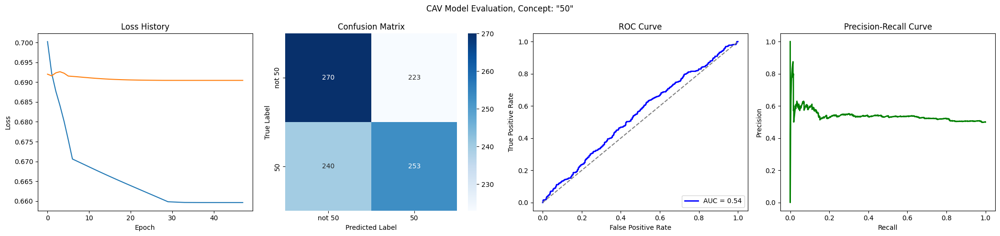

Training run 56/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6457
Epoch 11 Validation Loss: 0.6863
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6046
Epoch 21 Validation Loss: 0.6810
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5696
Epoch 31 Validation Loss: 0.6785
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5392
Epoch 41 Validation Loss: 0.6779
Early stopping at epoch 45
Loss history saved to trainings/singer_age_decade_50/loss_history.json


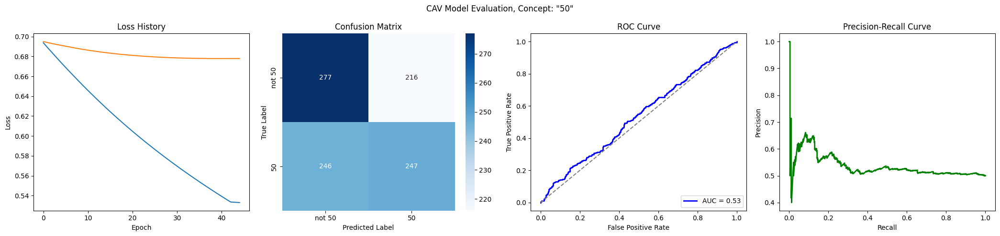

Training run 57/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6962
Epoch 1 Validation Loss: 0.6983
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6482
Epoch 11 Validation Loss: 0.6786
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6065
Epoch 21 Validation Loss: 0.6664
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5701
Epoch 31 Validation Loss: 0.6597
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5380
Epoch 41 Validation Loss: 0.6563
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5092
Epoch 51 Validation Loss: 0.6549
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4900
Epoch 61 Validation Loss: 0.6547
Early stopping at epoch 61
Loss history saved to trainings/singer_age_decade_50/loss_histor

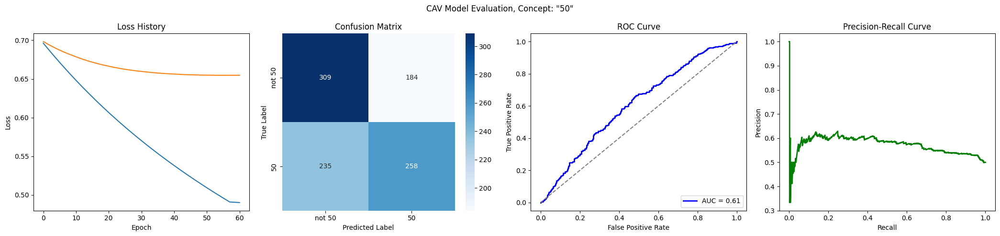

Training run 58/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6893
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6306
Epoch 11 Validation Loss: 0.6729
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5822
Epoch 21 Validation Loss: 0.6608
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5416
Epoch 31 Validation Loss: 0.6536
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5069
Epoch 41 Validation Loss: 0.6499
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4767
Epoch 51 Validation Loss: 0.6482
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4502
Epoch 61 Validation Loss: 0.6476
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 69
Los

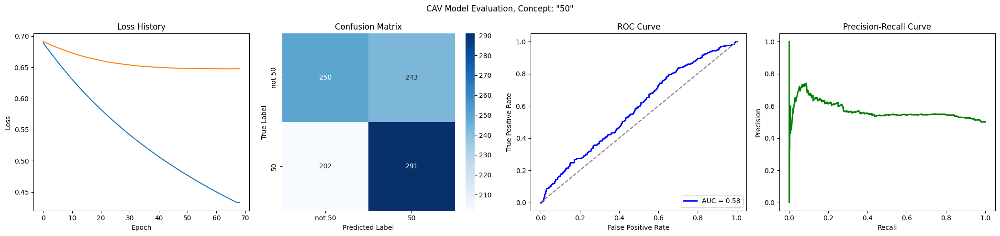

Training run 59/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6483
Epoch 11 Validation Loss: 0.6870
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6065
Epoch 21 Validation Loss: 0.6851
Early stopping at epoch 25
Loss history saved to trainings/singer_age_decade_50/loss_history.json


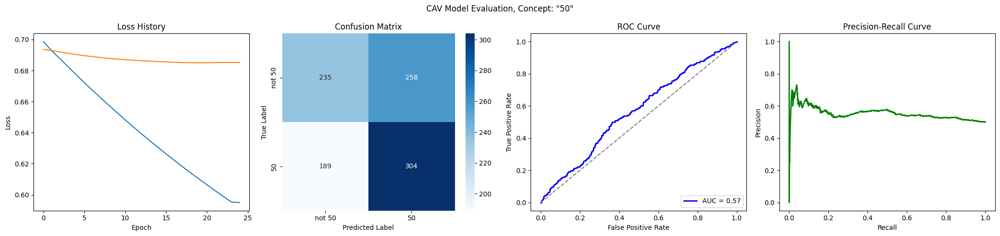

Training run 60/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6480
Epoch 11 Validation Loss: 0.6820
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6057
Epoch 21 Validation Loss: 0.6749
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5691
Epoch 31 Validation Loss: 0.6715
Early stopping at epoch 35
Loss history saved to trainings/singer_age_decade_50/loss_history.json


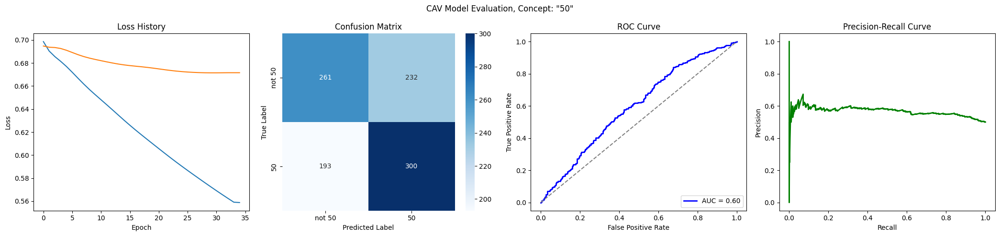

Training run 61/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6952
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6454
Epoch 11 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_50/loss_history.json


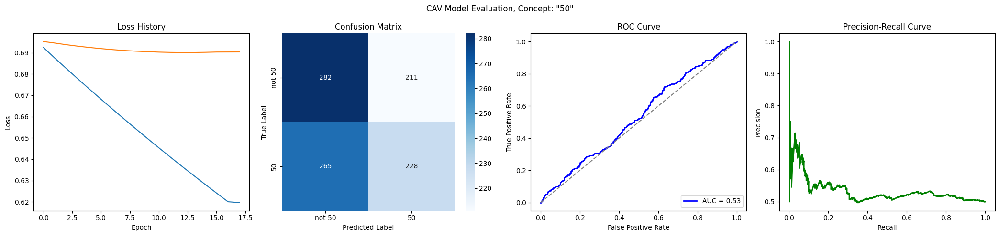

Training run 62/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6887
Epoch 1 Validation Loss: 0.6864
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6368
Epoch 11 Validation Loss: 0.6744
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5924
Epoch 21 Validation Loss: 0.6677
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5541
Epoch 31 Validation Loss: 0.6637
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5207
Epoch 41 Validation Loss: 0.6611
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4912
Epoch 51 Validation Loss: 0.6594
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4649
Epoch 61 Validation Loss: 0.6585
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

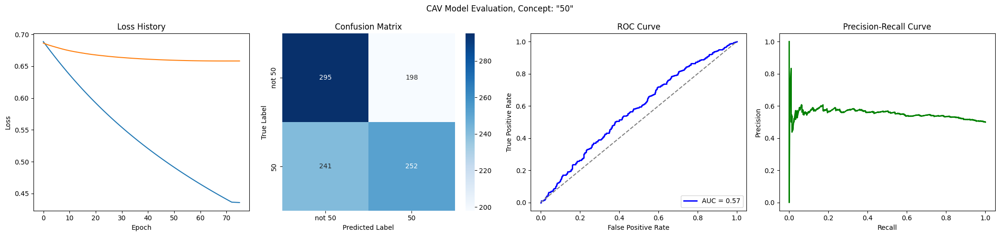

Training run 63/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6457
Epoch 11 Validation Loss: 0.6834
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6029
Epoch 21 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5665
Epoch 31 Validation Loss: 0.6785
Early stopping at epoch 33
Loss history saved to trainings/singer_age_decade_50/loss_history.json


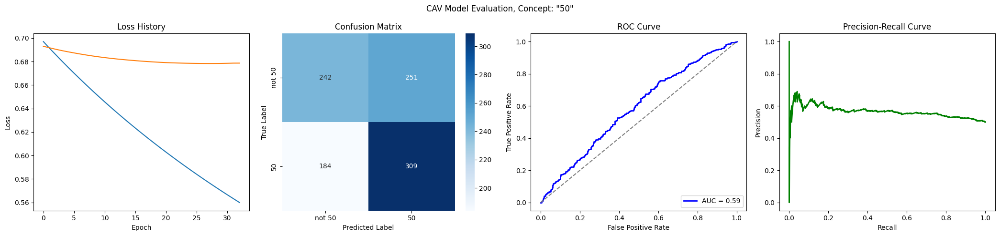

Training run 64/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6382
Epoch 11 Validation Loss: 0.6849
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5889
Epoch 21 Validation Loss: 0.6809
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5468
Epoch 31 Validation Loss: 0.6802
Early stopping at epoch 34
Loss history saved to trainings/singer_age_decade_50/loss_history.json


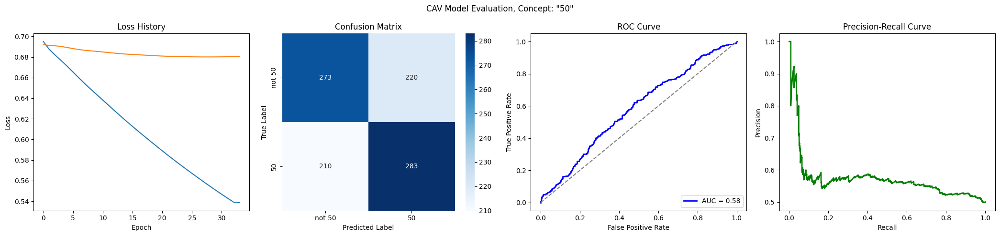

Training run 65/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7014
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6545
Epoch 11 Validation Loss: 0.6787
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6158
Epoch 21 Validation Loss: 0.6703
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5805
Epoch 31 Validation Loss: 0.6625
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5487
Epoch 41 Validation Loss: 0.6567
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5202
Epoch 51 Validation Loss: 0.6518
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4943
Epoch 61 Validation Loss: 0.6476
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

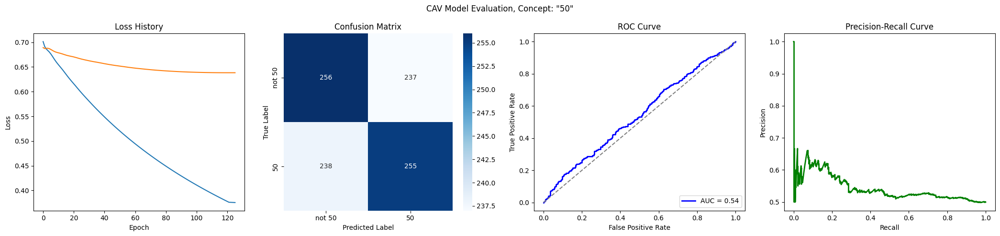

Training run 66/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7009
Epoch 1 Validation Loss: 0.7017
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6404
Epoch 11 Validation Loss: 0.6814
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5912
Epoch 21 Validation Loss: 0.6693
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5501
Epoch 31 Validation Loss: 0.6623
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5146
Epoch 41 Validation Loss: 0.6584
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4833
Epoch 51 Validation Loss: 0.6567
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4554
Epoch 61 Validation Loss: 0.6564
Early stopping at epoch 63
Loss history saved to trainings/singer_age_decade_50/loss_histor

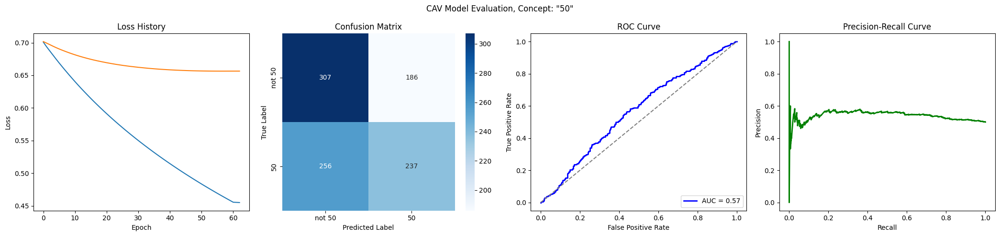

Training run 67/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6430
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6017
Epoch 21 Validation Loss: 0.6823
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/singer_age_decade_50/loss_history.json


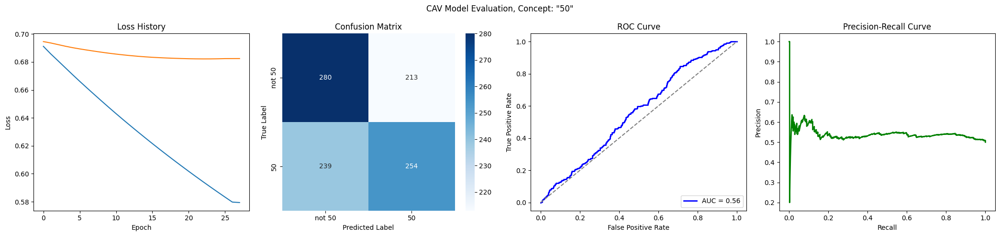

Training run 68/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6893
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6350
Epoch 11 Validation Loss: 0.6717
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5881
Epoch 21 Validation Loss: 0.6602
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5479
Epoch 31 Validation Loss: 0.6539
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5133
Epoch 41 Validation Loss: 0.6513
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4880
Epoch 51 Validation Loss: 0.6511
Early stopping at epoch 51
Loss history saved to trainings/singer_age_decade_50/loss_history.json


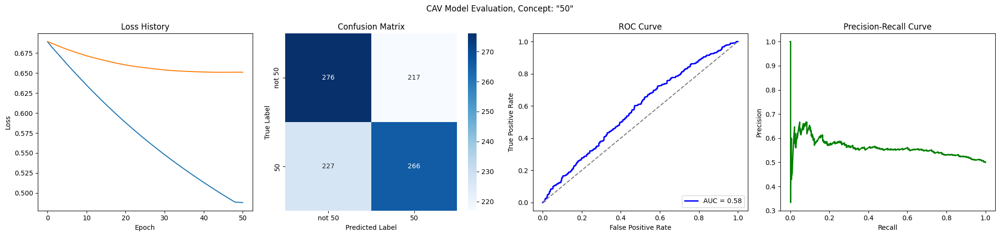

Training run 69/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6429
Epoch 11 Validation Loss: 0.6832
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5985
Epoch 21 Validation Loss: 0.6760
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5606
Epoch 31 Validation Loss: 0.6722
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5276
Epoch 41 Validation Loss: 0.6714
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_50/loss_history.json


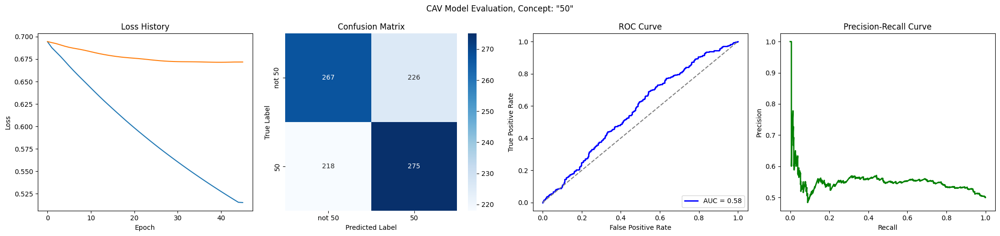

Training run 70/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6495
Epoch 11 Validation Loss: 0.6783
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6082
Epoch 21 Validation Loss: 0.6719
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5725
Epoch 31 Validation Loss: 0.6687
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5413
Epoch 41 Validation Loss: 0.6669
Early stopping at epoch 44
Loss history saved to trainings/singer_age_decade_50/loss_history.json


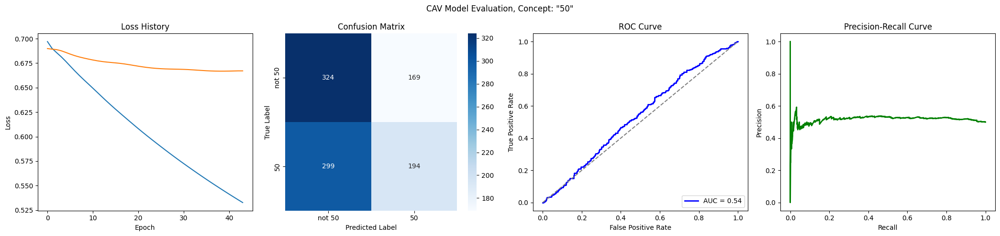

Training run 71/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_50/loss_history.json


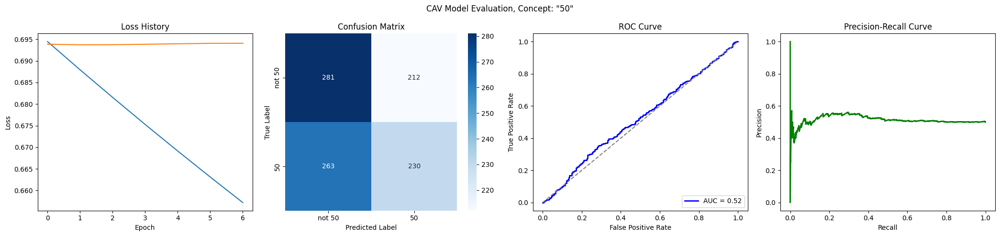

Training run 72/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7024
Epoch 1 Validation Loss: 0.6956
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6410
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5931
Epoch 21 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5548
Epoch 31 Validation Loss: 0.6744
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_50/loss_history.json


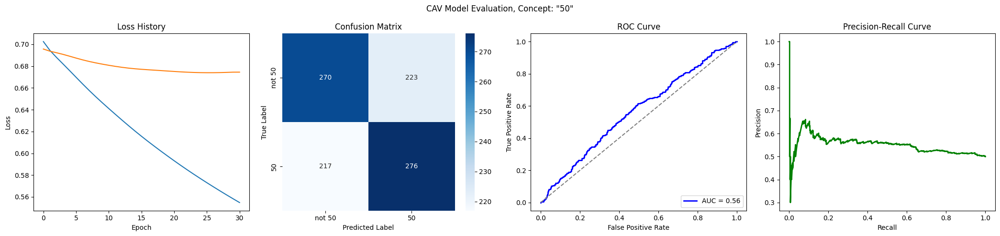

Training run 73/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6877
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6367
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5935
Epoch 21 Validation Loss: 0.6835
Early stopping at epoch 21
Loss history saved to trainings/singer_age_decade_50/loss_history.json


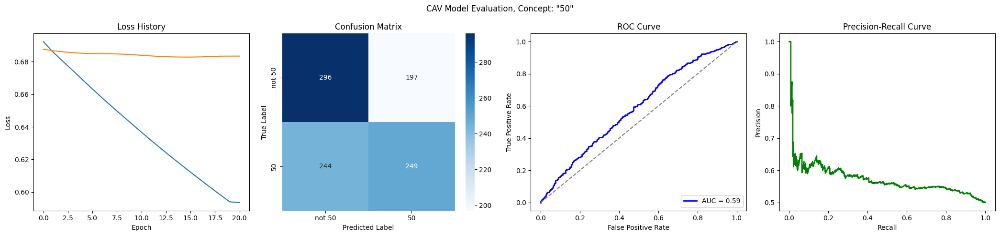

Training run 74/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6303
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5812
Epoch 21 Validation Loss: 0.6849
Epoch 31/500
Epoch 31 Train Loss: 0.5749
Epoch 31 Validation Loss: 0.6848
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5749
Epoch 41 Validation Loss: 0.6848
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_50/loss_history.json


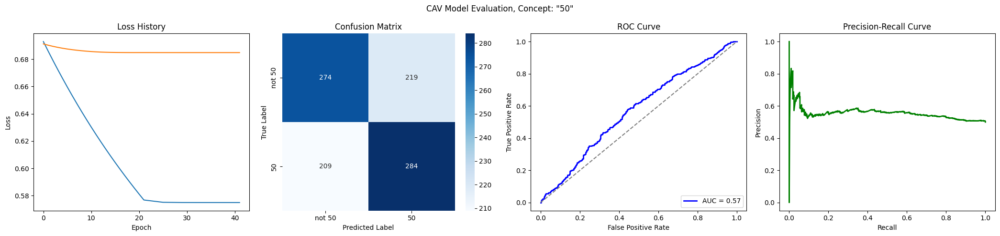

Training run 75/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7022
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6480
Epoch 11 Validation Loss: 0.6889
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_50/loss_history.json


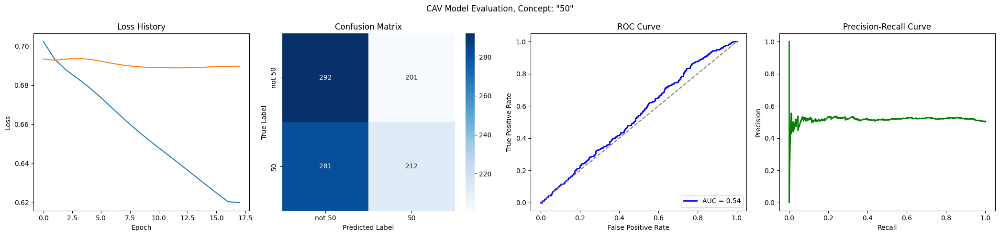

Training run 76/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_50/loss_history.json


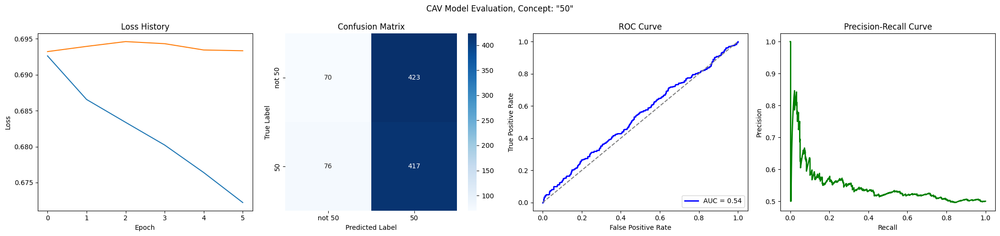

Training run 77/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6455
Epoch 11 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6029
Epoch 21 Validation Loss: 0.6680
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5659
Epoch 31 Validation Loss: 0.6600
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5335
Epoch 41 Validation Loss: 0.6538
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5046
Epoch 51 Validation Loss: 0.6487
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4787
Epoch 61 Validation Loss: 0.6445
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

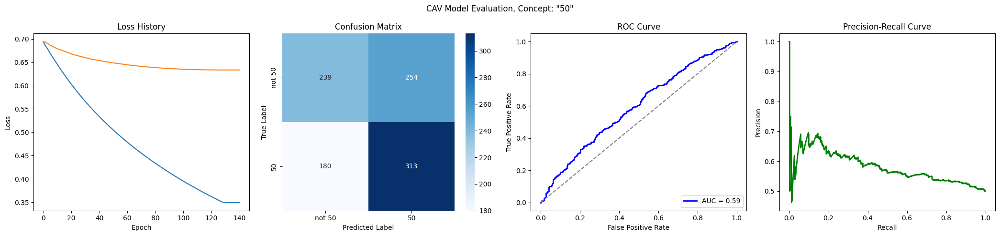

Training run 78/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_50/loss_history.json


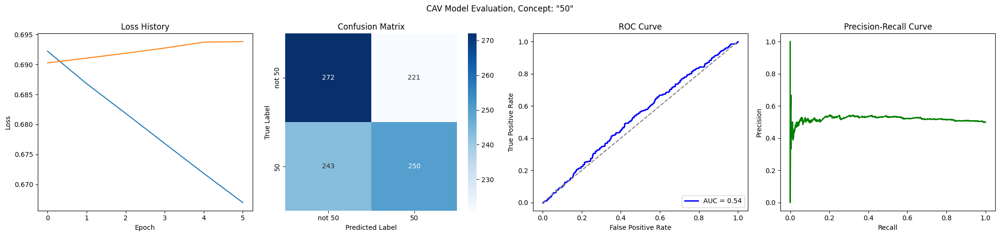

Training run 79/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6477
Epoch 11 Validation Loss: 0.6794
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6032
Epoch 21 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/singer_age_decade_50/loss_history.json


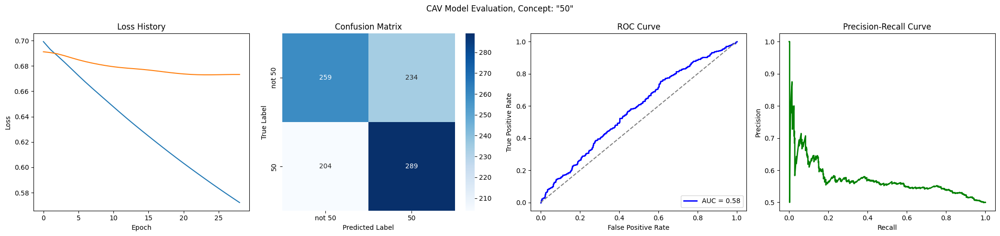

Training run 80/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6310
Epoch 11 Validation Loss: 0.6871
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_50/loss_history.json


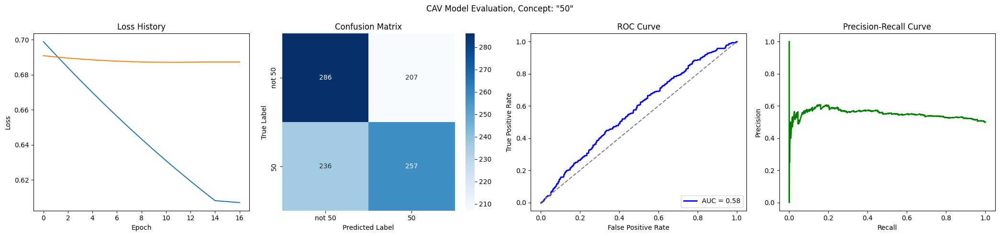

Training run 81/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7009
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6585
Epoch 11 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_50/loss_history.json


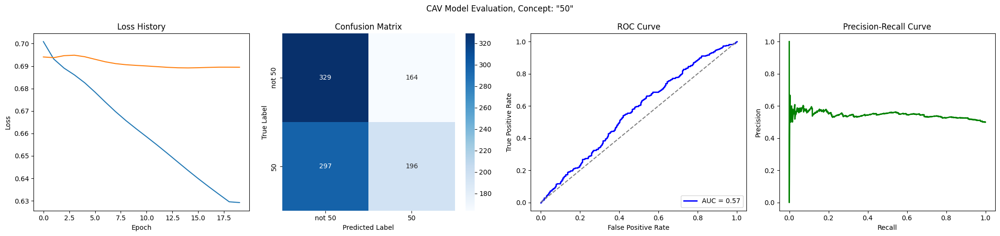

Training run 82/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6291
Epoch 11 Validation Loss: 0.6809
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5759
Epoch 21 Validation Loss: 0.6761
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/singer_age_decade_50/loss_history.json


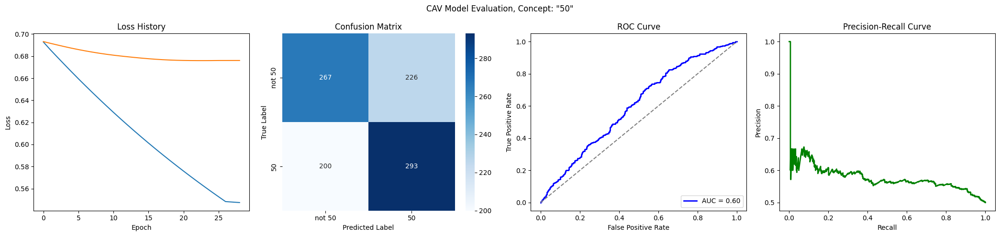

Training run 83/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6440
Epoch 11 Validation Loss: 0.6928
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6398
Epoch 21 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6358
Epoch 31 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6317
Epoch 41 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.6278
Epoch 51 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.6239
Epoch 61 Validation Loss: 0.6916
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

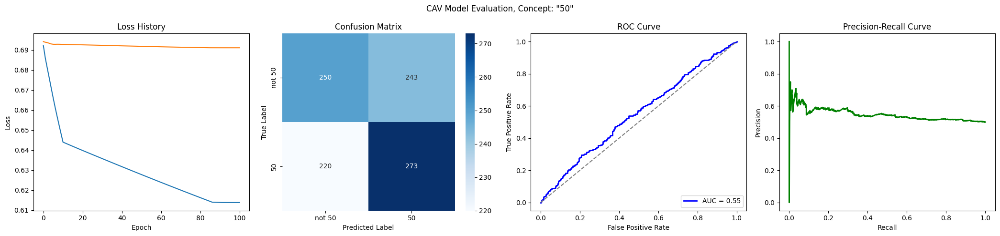

Training run 84/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6411
Epoch 11 Validation Loss: 0.6888
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_50/loss_history.json


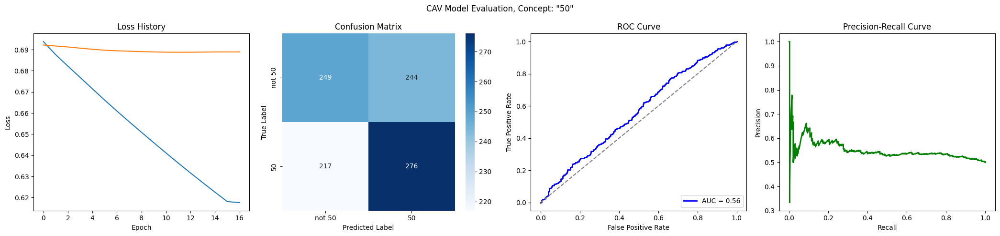

Training run 85/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_50/loss_history.json


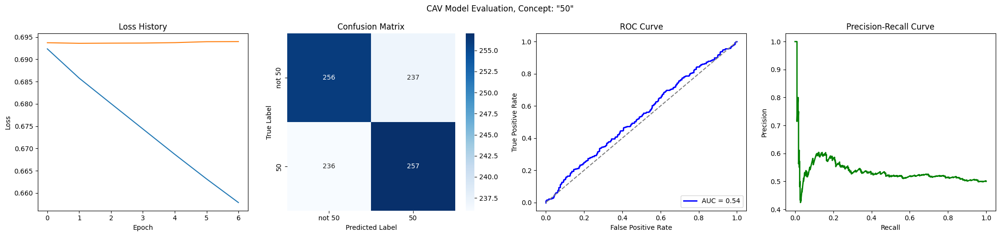

Training run 86/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6952
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6461
Epoch 11 Validation Loss: 0.6850
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6042
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5681
Epoch 31 Validation Loss: 0.6795
Early stopping at epoch 32
Loss history saved to trainings/singer_age_decade_50/loss_history.json


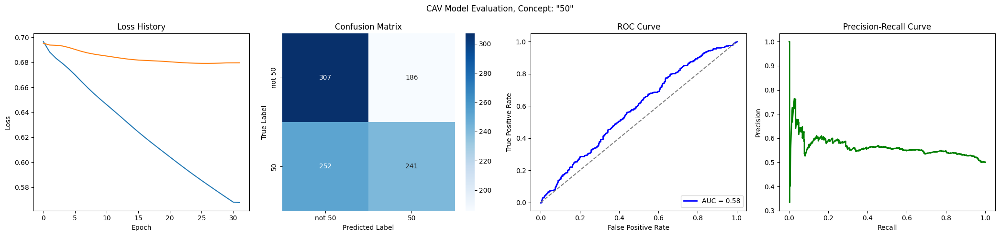

Training run 87/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6904
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6371
Epoch 11 Validation Loss: 0.6790
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5910
Epoch 21 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/singer_age_decade_50/loss_history.json


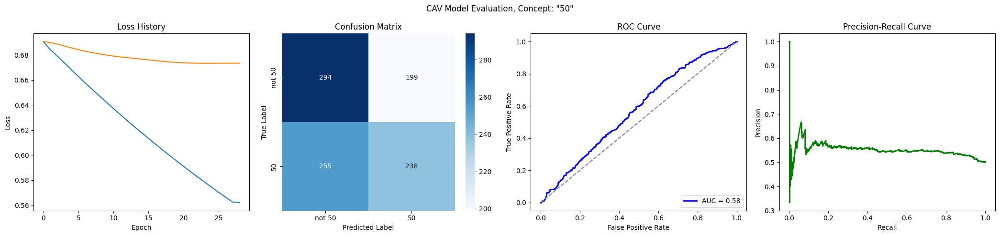

Training run 88/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6772
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6084
Epoch 21 Validation Loss: 0.6648
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5732
Epoch 31 Validation Loss: 0.6555
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5421
Epoch 41 Validation Loss: 0.6486
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5144
Epoch 51 Validation Loss: 0.6440
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4896
Epoch 61 Validation Loss: 0.6413
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

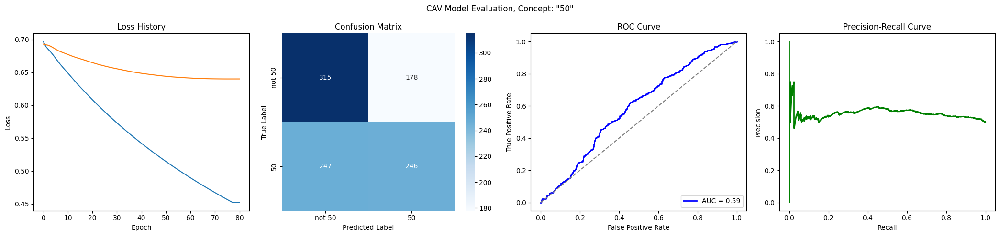

Training run 89/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6410
Epoch 11 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_50/loss_history.json


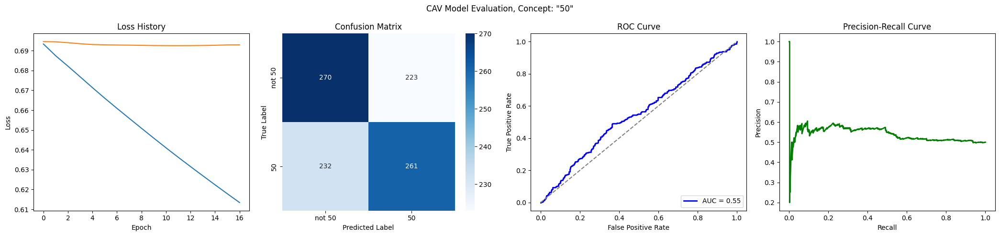

Training run 90/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7022
Epoch 1 Validation Loss: 0.6908
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6500
Epoch 11 Validation Loss: 0.6774
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6100
Epoch 21 Validation Loss: 0.6704
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5744
Epoch 31 Validation Loss: 0.6658
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5429
Epoch 41 Validation Loss: 0.6640
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5148
Epoch 51 Validation Loss: 0.6635
Early stopping at epoch 54
Loss history saved to trainings/singer_age_decade_50/loss_history.json


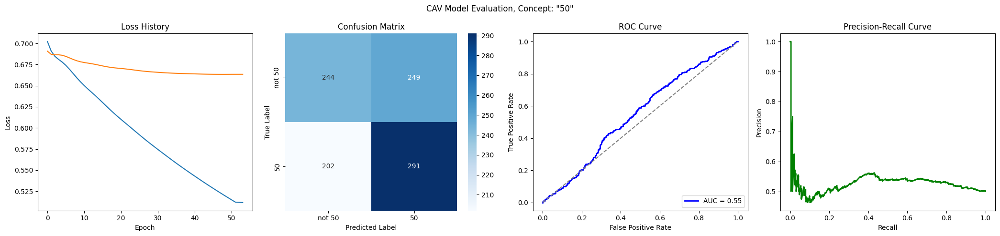

Training run 91/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6501
Epoch 11 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6095
Epoch 21 Validation Loss: 0.6862
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5736
Epoch 31 Validation Loss: 0.6840
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5416
Epoch 41 Validation Loss: 0.6829
Early stopping at epoch 43
Loss history saved to trainings/singer_age_decade_50/loss_history.json


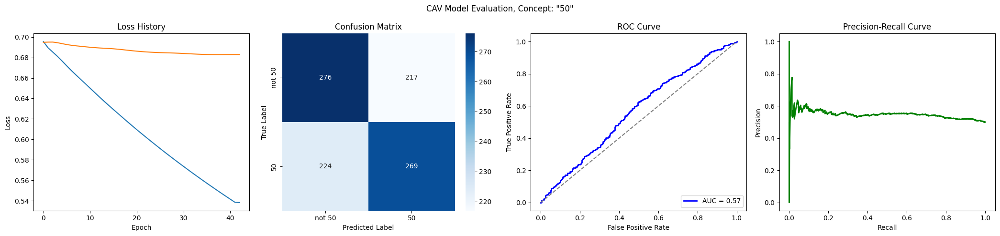

Training run 92/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6906
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6355
Epoch 11 Validation Loss: 0.6702
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5886
Epoch 21 Validation Loss: 0.6582
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5481
Epoch 31 Validation Loss: 0.6514
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5126
Epoch 41 Validation Loss: 0.6483
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4812
Epoch 51 Validation Loss: 0.6478
Early stopping at epoch 54
Loss history saved to trainings/singer_age_decade_50/loss_history.json


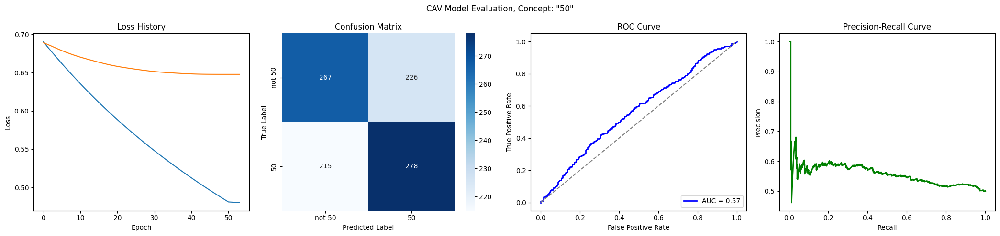

Training run 93/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6857
Epoch 1 Validation Loss: 0.6884
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6198
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5674
Epoch 21 Validation Loss: 0.6680
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5288
Epoch 31 Validation Loss: 0.6675
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_50/loss_history.json


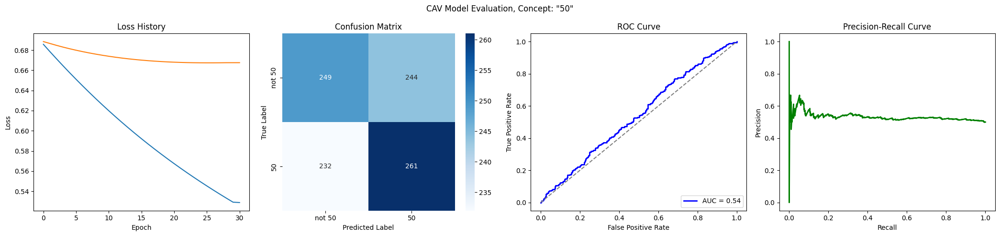

Training run 94/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6364
Epoch 11 Validation Loss: 0.6903
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_50/loss_history.json


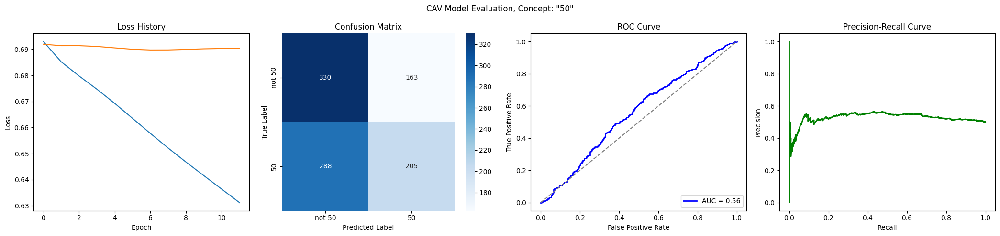

Training run 95/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6504
Epoch 11 Validation Loss: 0.6766
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6101
Epoch 21 Validation Loss: 0.6624
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5753
Epoch 31 Validation Loss: 0.6529
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5450
Epoch 41 Validation Loss: 0.6481
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5182
Epoch 51 Validation Loss: 0.6468
Early stopping at epoch 54
Loss history saved to trainings/singer_age_decade_50/loss_history.json


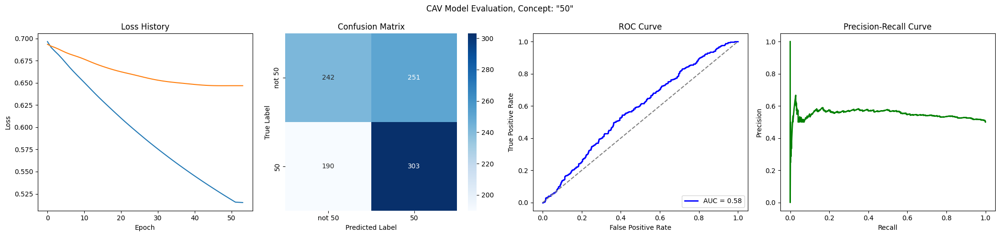

Training run 96/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6482
Epoch 11 Validation Loss: 0.6896
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_50/loss_history.json


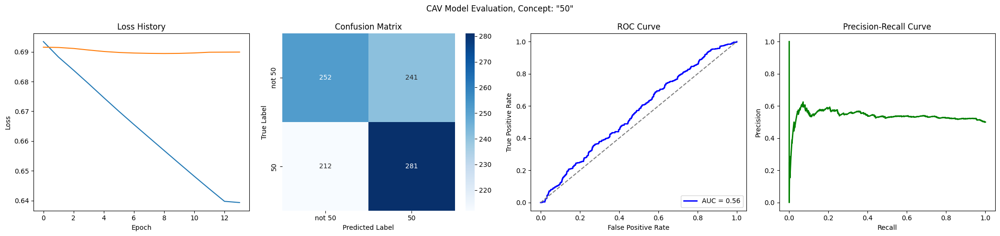

Training run 97/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6396
Epoch 11 Validation Loss: 0.6815
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5985
Epoch 21 Validation Loss: 0.6808
Early stopping at epoch 21
Loss history saved to trainings/singer_age_decade_50/loss_history.json


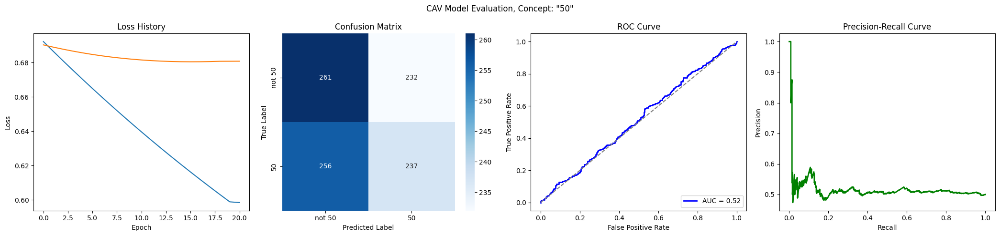

Training run 98/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6426
Epoch 11 Validation Loss: 0.6869
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6018
Epoch 21 Validation Loss: 0.6834
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5666
Epoch 31 Validation Loss: 0.6817
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5360
Epoch 41 Validation Loss: 0.6809
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5087
Epoch 51 Validation Loss: 0.6808
Early stopping at epoch 53
Loss history saved to trainings/singer_age_decade_50/loss_history.json


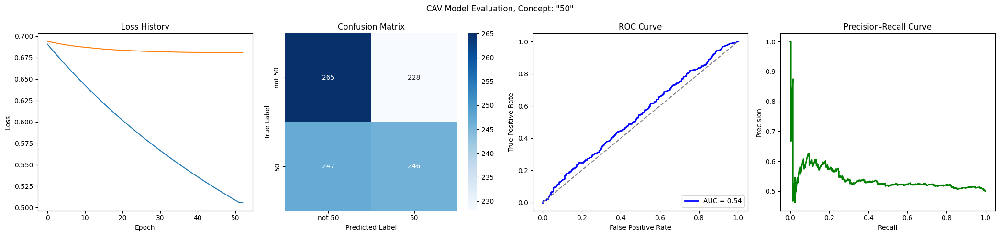

Training run 99/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6981
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6471
Epoch 11 Validation Loss: 0.6661
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6042
Epoch 21 Validation Loss: 0.6454
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5677
Epoch 31 Validation Loss: 0.6286
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5361
Epoch 41 Validation Loss: 0.6157
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5082
Epoch 51 Validation Loss: 0.6067
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4832
Epoch 61 Validation Loss: 0.6009
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

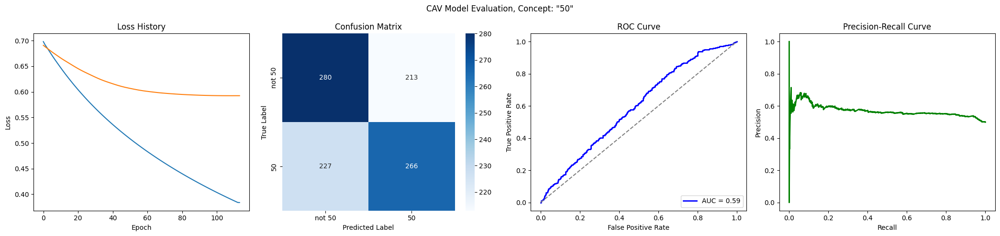

Training run 100/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6911
Epoch 1 Validation Loss: 0.6950
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6475
Epoch 11 Validation Loss: 0.6880
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6098
Epoch 21 Validation Loss: 0.6830
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5767
Epoch 31 Validation Loss: 0.6793
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5471
Epoch 41 Validation Loss: 0.6767
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5203
Epoch 51 Validation Loss: 0.6753
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5023
Epoch 61 Validation Loss: 0.6752
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 71/500
Epoch 71 Train L

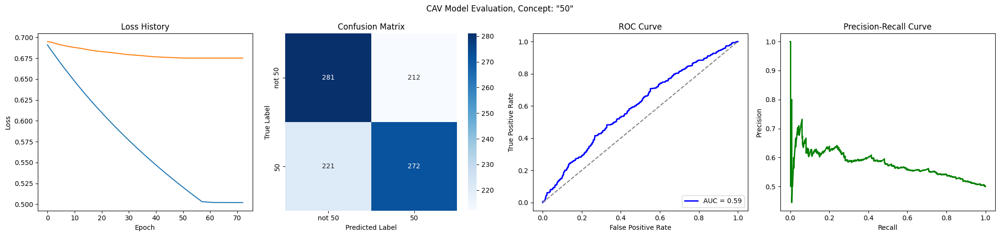

CPU times: user 7min 6s, sys: 3min 50s, total: 10min 57s
Wall time: 36min 19s


In [7]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [8]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [9]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [10]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [11]:
validation_sample_count

93

In [12]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


835 93
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6393
Epoch 11 Validation Loss: 0.6469
Model saved to trainings/singer_age_decade_50/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6143
Epoch 21 Validation Loss: 0.6411
Model saved to trainings/singer_age_decade_50/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_50/loss_history.json


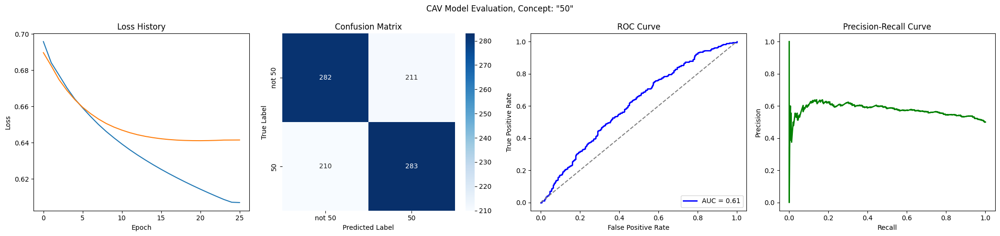

In [13]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
